# 1. ALOS-2/PALSAR2観測を使ったオイルパーム農園拡大と森林減少のモニタリング

まずはデータ処理に必要なパッケージをインストールします。Anacondaを管理者権限でインストールした場合はJupyter Notebookを管理者権限で実行する必要があります。

In [ ]:
!conda install -c conda-forge rasterio matplotlib gdal geopandas -y

本節では以下の手順でALOS-2/PALSAR2データによるオイルパーム農園拡大と森林減少の観測を例示する。

- 多偏波（HH/HV）のカラー合成画像に見られる特徴とGoogle Earth等の高分解画像から見られる土地被覆・土地利用の関連を理解する。
- ２時期の観測データを使った土地被覆・土地利用の変化を分析する手法 Change Vector Analysisを実践する。

## 1.1. PythonによるALOS-2/PALSAR-2データの可視化

### 1.1.1. オイルパーム農園がある熱帯林の PALSAR-2 データを可視化する

- 数年にわたるHHとHVのデータでカラー合成画像を作成酢する。
- 典型的な土地被覆の画像上の特徴を示し、Google Earth の高解像度画像と比較し、解釈する方法を理解する。

#### 1.1.1.1. 多偏波SARデータ HH と HV のカラー合成
- この実習では、Python を使用して ALOS-2 画像データを読み取り、可視化します。
- オイルパーム農園の拡大と森林減少の分析には、ALOS-2 の年次合成データが便利です。
- この演習ではJAXA ALOS-2 ポータルで公開される[全球PALSAR-2/PALSAR/JERS-1モザイクおよび森林・非森林マップ](https://www.eorc.jaxa.jp/ALOS/jp/dataset/fnf_j.htm) を使います。

![DownloadingALOS-2Data.png](download_alos2.png)

なお、この実習では、時間を節約するためにあらかじめデータを用意しました。1-demo_data.zipを使います。

In [1]:
#! curl --output 1-demo_data.zip http://owncloud.glodal-inc.net/owncloud/index.php/s/uKogtY6XPfokBVN/download
import shutil, os
os.makedirs('1-demo_data', exist_ok=True)
shutil.unpack_archive("1-demo_data.zip", "1-demo_data")
os.chdir('1-demo_data')
os.listdir()

['2007HHcalibrated5_image.tif',
 '2007HVcalibrated5_image.tif',
 '2010HHcalibrated5_image.tif',
 '2010HVcalibrated5_image.tif',
 'Alos_2_2007_HH.tif',
 'Alos_2_2007_HV.tif',
 'Alos_2_2010_HH.tif',
 'Alos_2_2010_HV.tif',
 'Alos_2_2015_HH.tif',
 'Alos_2_2015_HV.tif',
 'Alos_2_2020_HH.tif',
 'Alos_2_2020_HV.tif']

##### RGB合成画像の作成

PALSAR-2のHH/HVをRGBチャンネル（赤、緑、青）に割り当てて画像上の特徴から土地被覆・土地利用を分析します。以下の手順でSAR画像を可視化してみましょう。

カラー合成の前にHH, HVそれぞれの画像を見てみましょう。2007年と2010年の年次合成データを扱います。rasterioでファイル名を指定し画像データを読み込みます。

In [3]:
import rasterio

# ALOS-2 2007 をロード
with rasterio.open('Alos_2_2007_HH.tif') as src:
    hh_2007 = src.read(1)
with rasterio.open('Alos_2_2007_HV.tif') as src:
    hv_2007 = src.read(1)
    
# ALOS-2 2010 をロード
with rasterio.open('Alos_2_2010_HH.tif') as src:
    hh_2010 = src.read(1)
with rasterio.open('Alos_2_2010_HV.tif') as src:
    hv_2010 = src.read(1)


それぞれの画像を見てみましょう。

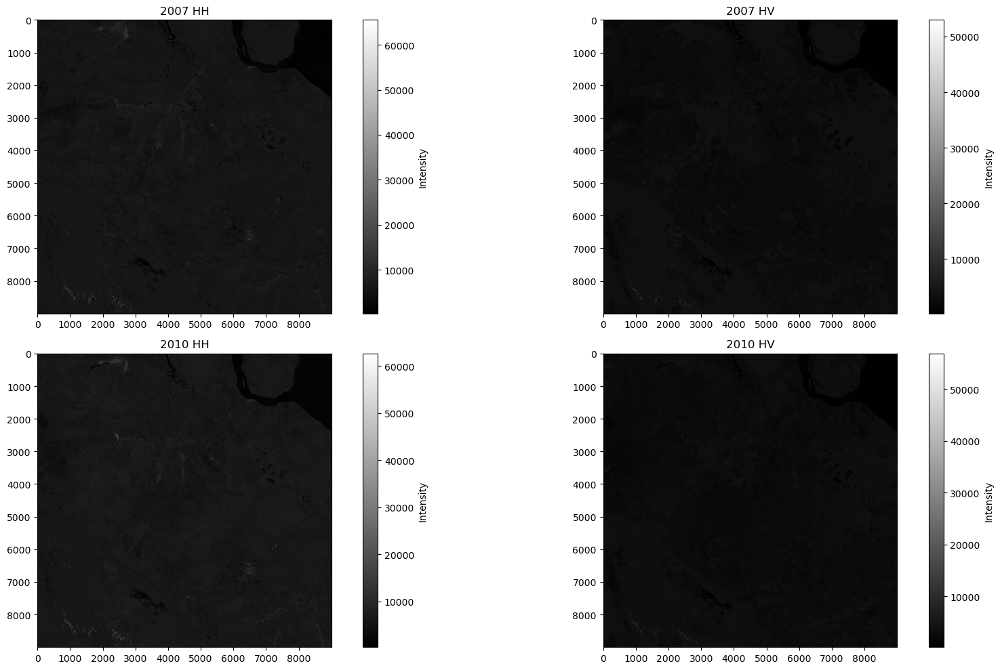

In [5]:
import matplotlib.pyplot as plt

# Data and titles for plots
data = [
    (hh_2007, "2007 HH"),
    (hv_2007, "2007 HV"),
    (hh_2010, "2010 HH"),
    (hv_2010, "2010 HV"),
]

# Create a 2x2 plot layout
fig, axs = plt.subplots(2, 2, figsize=(18, 10))

# Loop through axes and data to plot
for ax, (image, title) in zip(axs.flat, data):
    img = ax.imshow(image, cmap='gray')
    ax.set_title(title)
    fig.colorbar(img, ax=ax, orientation='vertical', label='Intensity')

# Adjust layout and display
plt.tight_layout()
plt.show()


グレースケール画像が表示されます。HHと赤チャンネル、HVを緑チャンネルと青チャンネルに割り当てて合成画像を作成します。

In [7]:
import numpy as np
# Stack images into RGB channels: HH_t1 as Red, HV_t2 as Green, HH_t3 as Blue
rgb_composite_2007 = np.dstack((hh_2007, hv_2007, hv_2007))
rgb_composite_2010 = np.dstack((hh_2010, hv_2010, hv_2010))

作成した合成画像を表示します。

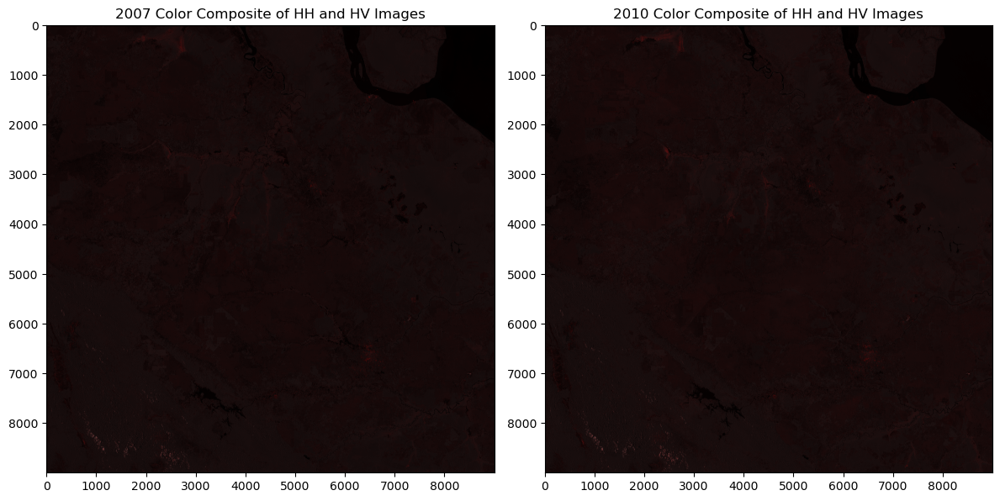

In [9]:
# Normalize 2007 composite
rgb_composite_2007 = (rgb_composite_2007 - np.min(rgb_composite_2007)) / (np.max(rgb_composite_2007) - np.min(rgb_composite_2007))

# Normalize 2010 composite
rgb_composite_2010 = (rgb_composite_2010 - np.min(rgb_composite_2010)) / (np.max(rgb_composite_2010) - np.min(rgb_composite_2010))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
# Plot 2007 composite
im1 = ax1.imshow(rgb_composite_2007)
ax1.set_title("2007 Color Composite of HH and HV Images")
# Plot 2010 composite
im2 = ax2.imshow(rgb_composite_2010)
ax2.set_title("2010 Color Composite of HH and HV Images")

plt.tight_layout()
plt.show()

全体的に暗いため解釈が難しいです。コントラストを調整します。

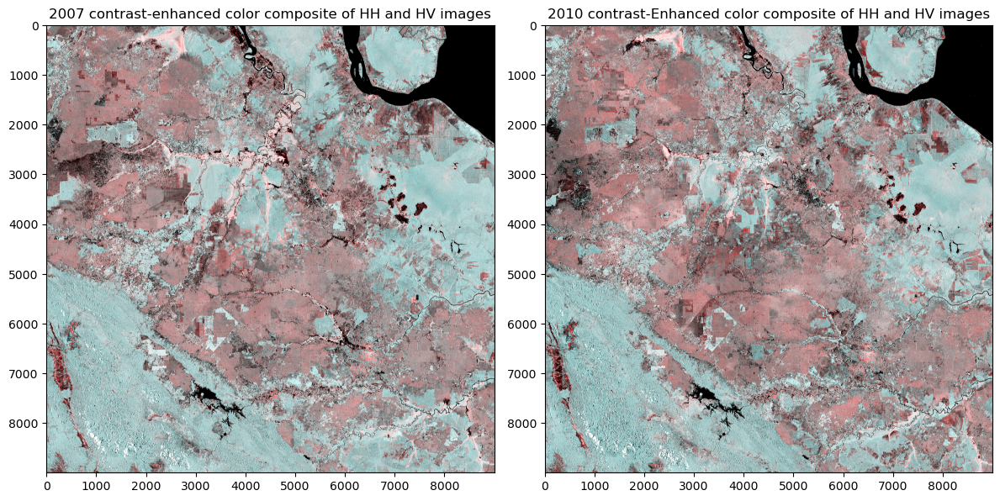

In [11]:
# Function to enhance the RGB composite
def enhance_composite(rgb_composite, gamma=0.5):
    # Apply gamma correction
    rgb_composite_gamma = np.zeros_like(rgb_composite)
    for i in range(3): 
        rgb_composite_gamma[:, :, i] = np.power(rgb_composite[:, :, i], gamma)

    # Calculate percentiles for contrast stretching
    p2_r, p98_r = np.percentile(rgb_composite_gamma[:, :, 0], (5, 95))
    p2_g, p98_g = np.percentile(rgb_composite_gamma[:, :, 1], (5, 95))
    p2_b, p98_b = np.percentile(rgb_composite_gamma[:, :, 2], (5, 95))

    # Perform contrast stretching
    r_stretched = np.clip((rgb_composite_gamma[:, :, 0] - p2_r) / (p98_r - p2_r), 0, 1)
    g_stretched = np.clip((rgb_composite_gamma[:, :, 1] - p2_g) / (p98_g - p2_g), 0, 1)
    b_stretched = np.clip((rgb_composite_gamma[:, :, 2] - p2_b) / (p98_b - p2_b), 0, 1)

    # Combine stretched channels back into an RGB image
    return np.dstack((r_stretched, g_stretched, b_stretched))

# Enhance both 2007 and 2010 composites
rgb_composite_enhanced_2007 = enhance_composite(rgb_composite_2007)
rgb_composite_enhanced_2010 = enhance_composite(rgb_composite_2010)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
# Plot 2007 enhanced composite
im1 = ax1.imshow(rgb_composite_enhanced_2007)
ax1.set_title("2007 contrast-enhanced color composite of HH and HV images")
# Plot 2010 enhanced composite
im2 = ax2.imshow(rgb_composite_enhanced_2010)
ax2.set_title("2010 contrast-Enhanced color composite of HH and HV images")

plt.tight_layout()
plt.show()

カラー合成とコントラスト調整により対象領域の土地被覆・土地利用の解釈ができるようになりました。赤色の領域はHVに比べてHHの散乱が大きい、青白い領域はHHに比べてHVの散乱が大きいことを表しています。


#### 1.1.1.2. 典型的な土地被覆の解釈例

ALOS-2/PALSAR-2カラー合成画像の画像パターンから土地被覆を解釈できます。[基本的な原理はリンク先の解説内「Polarization and Scattering Mechanisms」をご覧下さい](https://www.earthdata.nasa.gov/learn/earth-observation-data-basics/sar)。画像パターンを解釈することで土地利用・土地被覆の分布を把握できます。以下に解釈の例を示します。

この実習では、青白い領域は森林を表し、赤い領域はまばらな植生、特にオイルパーム農園を表していることに注目します。

![](Picture1.jpg)

#### 1.1.1.3. 時系列データのカラー合成画像によるオイルパーム農園拡大の分析

ここで更に多くの時期の年次データを可視化して、この領域におけるオイルパーム農園の動態を分析してみましょう。

In [13]:
rgb_composite = list()
rgb_composite_enhanced = list()

for YYYY in [2007, 2010, 2015, 2020]:
    hh = rasterio.open('Alos_2_' + str(YYYY) + '_HH.tif').read(1)
    hv = rasterio.open('Alos_2_' + str(YYYY) + '_HV.tif').read(1)
    rgb_composite_enhanced.append(enhance_composite(np.dstack((hh, hv, hv))))


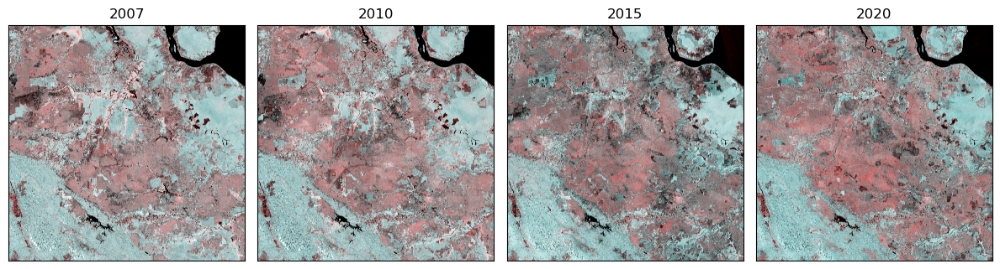

In [14]:
import matplotlib.pyplot as plt

YYYY = [2007, 2010, 2015, 2020]

# Create subplots
fig, axes = plt.subplots(1, len(YYYY), figsize=(12, 24))

# Iterate over axes and data to plot
for ax, year, image in zip(axes, YYYY, rgb_composite_enhanced):
    ax.imshow(image)
    ax.set_title(str(year))
    # Remove axis labels
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

ここで領域の西端中央より少し北の領域を詳しく見てみましょう。

|   オイルパーム農園への植生           | 2007                                  | 2010                | 2015                   | 2020 |
|-------------------|----------------------------------|-------------------------------|---------------------------------|-----------------------------------------|
|**ALOS-2/PALSAR-2 合成画像  (R:HH G:HV B:HV)**        | ![07rgb.png](07rgb.png) | ![10rgb.png](10rgb.png) |![15rgb.png](15rgb.png) | ![20rgb.png](20rgb.png) |
| **Google Earthの衛星写真**       | ![07gg.png](07gg.png)      | ![10gg.png](10gg.png) | ![15gg.png](15gg.png) | ![20gg.png](20gg.png) |

この領域の中央付近（緯度1.26, 経度100.10あたり）には、Google Earth上に**運良く2013年12月の高分解能画像**が収録されているので見てみると、パームヤシが整然と並んでいることを確認できます。2007年には森林被覆だった領域（青白い領域）が10年超かけてオイルパーム農園として開発された変遷が推察されます。

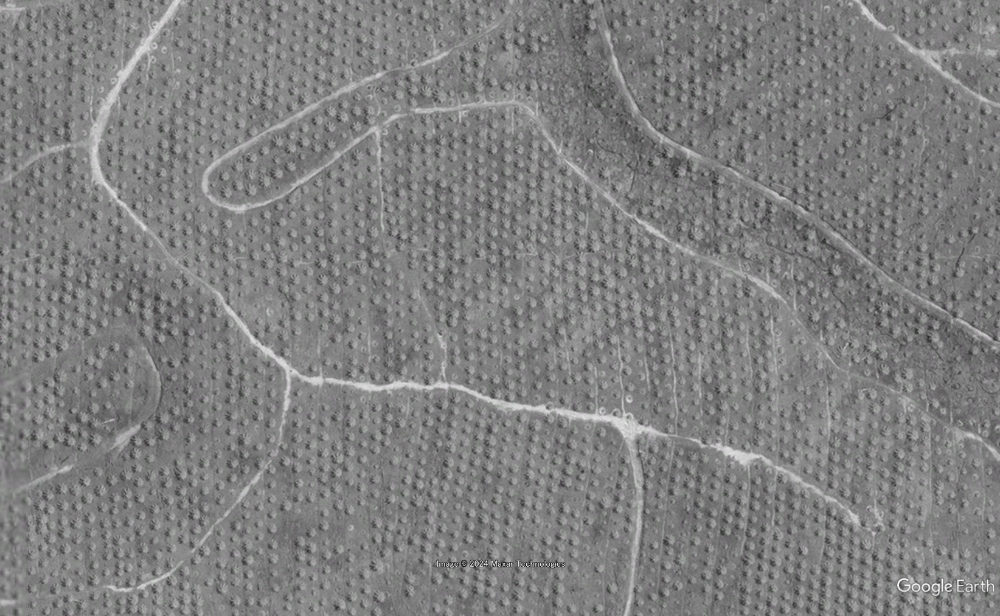

また、2010年に黒い領域（HV/HHともに散乱が小さい；緯度1.273, 経度100.094付近）領域について、**運良く2013年6月の高分解能画像**が収録されているので、切り拓かれた後が部分的に残っており、オイルパームが点在する様子が見られます。オイルパームがパーム油を生産できるように生長するには数年かかることを鑑みると、PALSAR-2データにはオイルパーム生長の変遷を捉えていると考えられます。

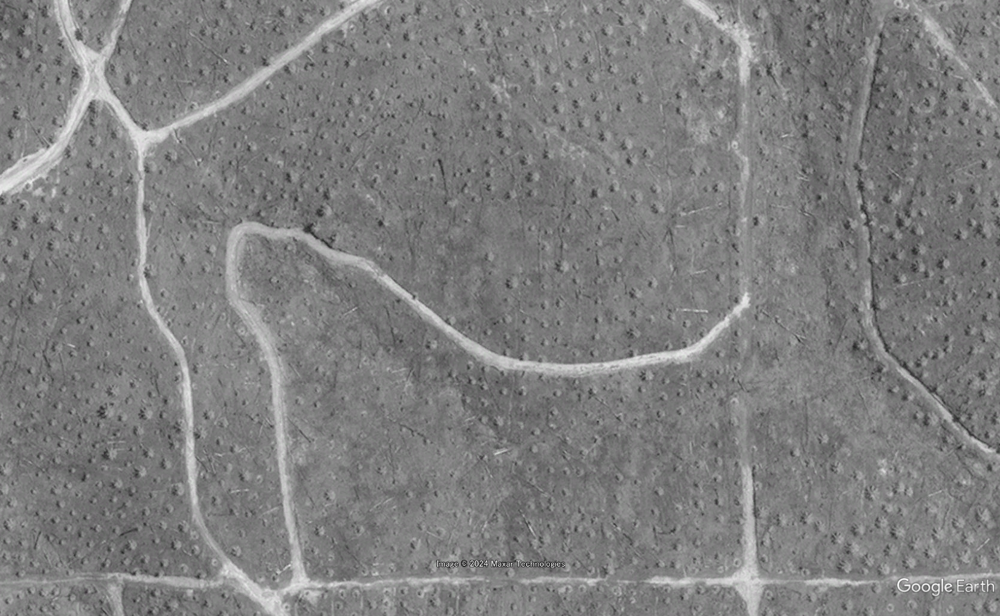

#### メモリ管理

不要なデータのメモリを解放します。

In [17]:
del rgb_composite_enhanced, hv, hh, rgb_composite_2007, rgb_composite_2010, rgb_composite_enhanced_2007, rgb_composite_enhanced_2010 

## 1.2. ２時期データの解析による変化検出分析

この節では、２時期のHH/HV散乱強度をChange Vector Analysisで解析することで、変化を検出・分析する手順を実践します。前節ではカラー合成画像の色調やパターンを年次で比較しながら土地被覆・土地利用の変化を分析しましたが、広域にわたる分析ではいちいち目視で確認することは現実的ではありません。

Change vector analysisは２次元のデータポイントの変化分析に用いられる手法で、PALSAR-2のHH/HV変化を分析するには効果的な手法です。この節では2007年と2010年の年次合成データを解析しながら手順と解釈の理解を深めます。[参考１](https://web.pdx.edu/~nauna/week5.pdf), [参考２](https://www.isprs.org/proceedings/xxxiv/part1/paper/00014.pdf)

### 1.2.1. DN値から後方散乱係数への変換

前節では画素値（DN; digital number）をそのまま可視化に用いましたが、厳密なデータ解析においては画素値を後方散乱係数に変換することが望ましいです。以下の式で変換します。

$$ \gamma^{0} = 10 log_{10} <DN^2> + CF $$

ただし、<>はノイズ低減のための平均化を表し、CFには-83.0 dBを用いる。[全球25m分解能PALSAR-2/PALSARモザイク（Ver.2.4.0） データセット説明書](https://www.eorc.jaxa.jp/ALOS/jp/dataset/pdf/DatasetDescription_PALSAR2_Mosaic_ver240_ja.pdf)。以下にコーディング例を示します。

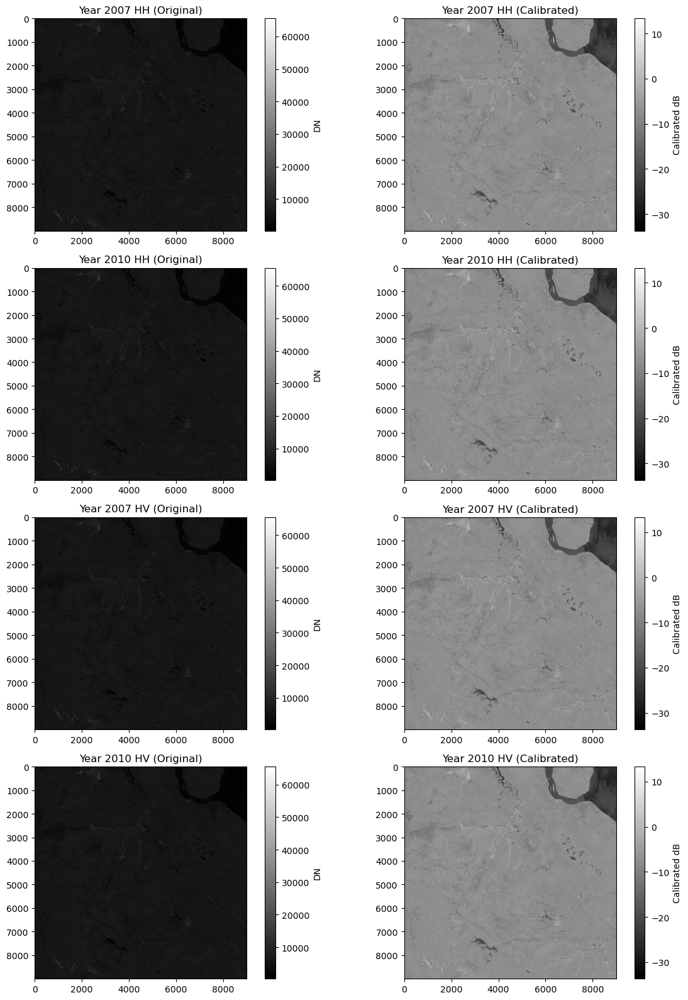

In [19]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

def calibrate_ima(image):
    return 10 * np.log10(image ** 2) - 83.0

def ima_cal(file_path):
    with rasterio.open(file_path) as src:
        original = src.read(1).astype('float32')
        calibrated = calibrate_ima(original)
    return original, calibrated

hh_2007_path = "Alos_2_2007_HH.tif" 
hh_2010_path = "Alos_2_2010_HH.tif"
hv_2007_path = "Alos_2_2007_HV.tif"
hv_2010_path = "Alos_2_2010_HV.tif"

hh_2007_raw, hh_2007_cal = ima_cal(hh_2007_path)
hh_2010_raw, hh_2010_cal = ima_cal(hh_2010_path)
hv_2007_raw, hv_2007_cal = ima_cal(hv_2007_path)
hv_2010_raw, hv_2010_cal = ima_cal(hv_2010_path)

fig, axs = plt.subplots(4, 2, figsize=(12, 16))

axs[0, 0].imshow(hh_2007_raw, cmap='gray')
axs[0, 0].set_title('Year 2007 HH (Original)')
axs[0, 1].imshow(hh_2007_cal, cmap='gray')
axs[0, 1].set_title('Year 2007 HH (Calibrated)')

axs[1, 0].imshow(hh_2010_raw, cmap='gray')
axs[1, 0].set_title('Year 2010 HH (Original)')
axs[1, 1].imshow(hh_2010_cal, cmap='gray')
axs[1, 1].set_title('Year 2010 HH (Calibrated)')

axs[2, 0].imshow(hv_2007_raw, cmap='gray')
axs[2, 0].set_title('Year 2007 HV (Original)')
axs[2, 1].imshow(hv_2007_cal, cmap='gray')
axs[2, 1].set_title('Year 2007 HV (Calibrated)')

axs[3, 0].imshow(hv_2010_raw, cmap='gray')
axs[3, 0].set_title('Year 2010 HV (Original)')
axs[3, 1].imshow(hv_2010_cal, cmap='gray')
axs[3, 1].set_title('Year 2010 HV (Calibrated)')

for i in range(4):
    fig.colorbar(axs[i, 0].imshow(hh_2007_raw, cmap='gray'), ax=axs[i, 0], orientation='vertical', label='DN')
    fig.colorbar(axs[i, 1].imshow(hh_2007_cal, cmap='gray'), ax=axs[i, 1], orientation='vertical', label='Calibrated dB')

plt.tight_layout()
plt.show()

##### (オプショナル) 変換処理に時間がかかる場合

上記の処理はPCの性能によっては時間がかかります。その場合には処理を停止し、以下のセルを実行してください。

In [ ]:
with rasterio.open('2007HHcalibrated5_image.tif') as src:
    hh_2007_cal = src.read(1)
with rasterio.open('2007HVcalibrated5_image.tif') as src:
    hv_2007_cal = src.read(1)
    
# ALOS-2 2010 をロード
with rasterio.open('2010HHcalibrated5_image.tif') as src:
    hh_2010_cal = src.read(1)
with rasterio.open('2010HVcalibrated5_image.tif') as src:
    hv_2010_cal = src.read(1)


### 1.2.2. HH/HVの変化分析

HH/HVそれぞれについて2007年から2010年にかけての変化を分析するために画像データの差分を計算します。

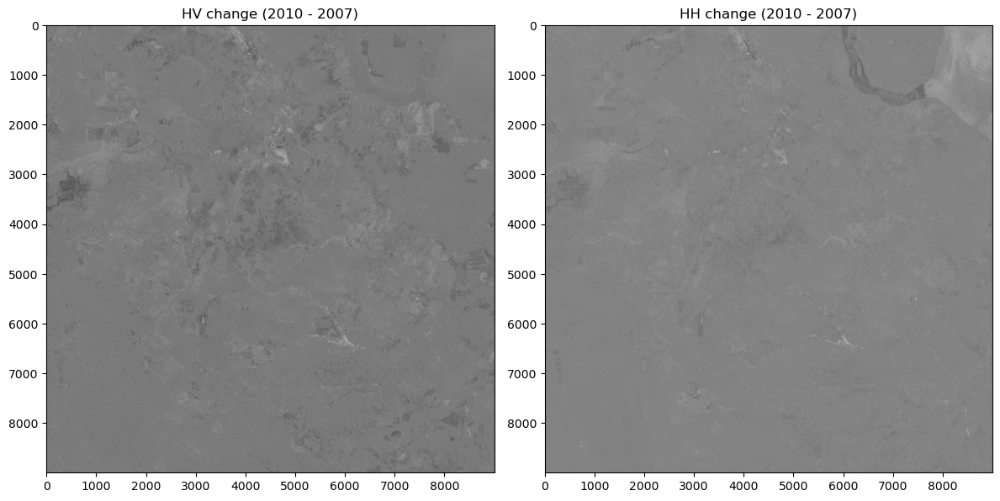

In [21]:
delta_bandhv_cal = hv_2010_cal - hv_2007_cal
delta_bandhh_cal = hh_2010_cal - hh_2007_cal

fig, axs = plt.subplots(1, 2, figsize=(12, 16))

axs[0].imshow(delta_bandhv_cal, cmap='gray')
axs[0].set_title('HV change (2010 - 2007)')
axs[1].imshow(delta_bandhh_cal, cmap='gray')
axs[1].set_title('HH change (2010 - 2007)')
plt.tight_layout()
plt.show()

ピクセルの輝度が暗い領域が減少を表し、明るい領域は増加を表します。HVの減少はVolume scatteringが減少したことを表し、森林が伐採されたと推定されます。この差分画像のピクセル値はたいてい正規分布にのっており、両側約2.5% を有意な変化としてみなし、$ \mu \pm 2 * \sigma $を閾値とする分類によって、変化の検出に用いることができます。この手順は、別の指標にて実践するため、ここでは割愛します。

### 1.2.3. Change vector analysis (CVA) データ解析

前節で計算した差分画像に表れる変化は、それぞれの画素についてHH/HVペアの２次元空間でベクトルとして表現できます。下図ではHVが大きく減少する一方でHHが僅かに減少した例を表します。以下のコードセルでは各画素における変化ベクトルの長さを magnitude、向きを angle として計算します。

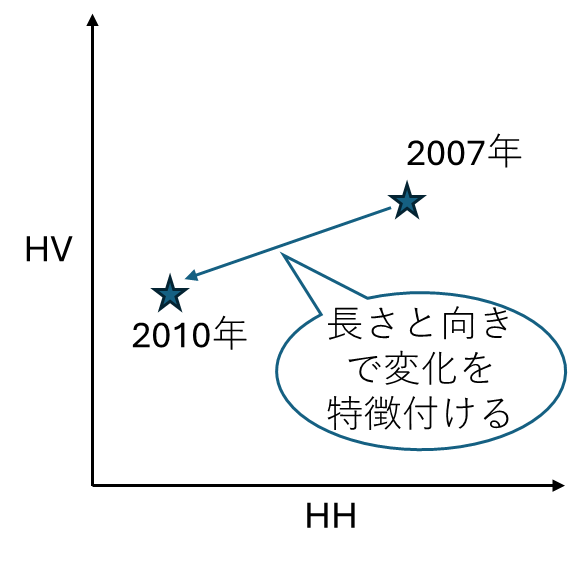

In [23]:
magnitude = np.sqrt(delta_bandhv_cal**2 + delta_bandhh_cal**2)
angle = np.arctan2(delta_bandhv_cal, delta_bandhh_cal) #Radians: When using trigonometric functions like arctan or atan2, the default output is often in radians, where 00 to 2𝜋2π radians (approximately 00 to 6.286.28) covers the full circular range of angles.

計算結果を可視化してみましょう。

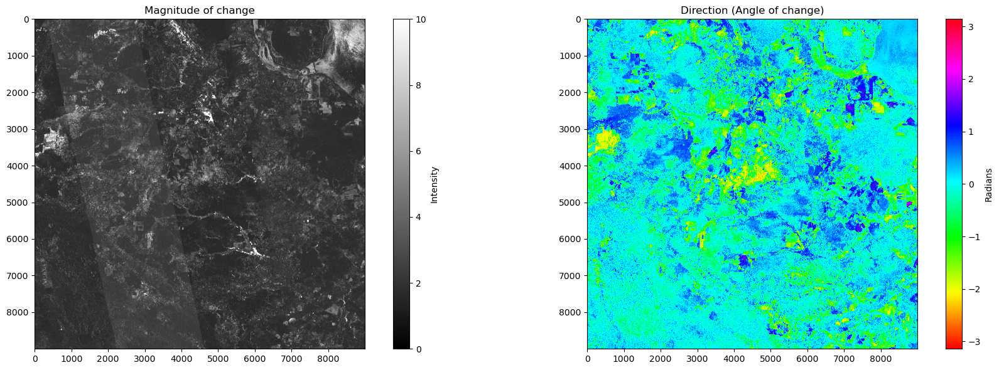

In [25]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

norm_magnitude = mcolors.Normalize(vmin=0, vmax=10)

fig, axs = plt.subplots(1, 2, figsize=(18, 6))

im1 = axs[0].imshow(magnitude, cmap='gray', norm=norm_magnitude)
axs[0].set_title("Magnitude of change")
cbar1 = fig.colorbar(im1, ax=axs[0])
cbar1.set_label("Intensity")

im2 = axs[1].imshow(angle, cmap='hsv')
axs[1].set_title("Direction (Angle of change)")
cbar2 = fig.colorbar(im2, ax=axs[1])
cbar2.set_label("Radians")

plt.tight_layout()
plt.show()

magnitudeの画像内に特に画素値が高い領域が幾つか表れました。magnitudeは概ね正規分布に従っているので分布の端を有意な変化としてみなすことができそうです。したがって、$\mu + 2 * \sigma $を閾値として有意な変化がある領域を抽出します。

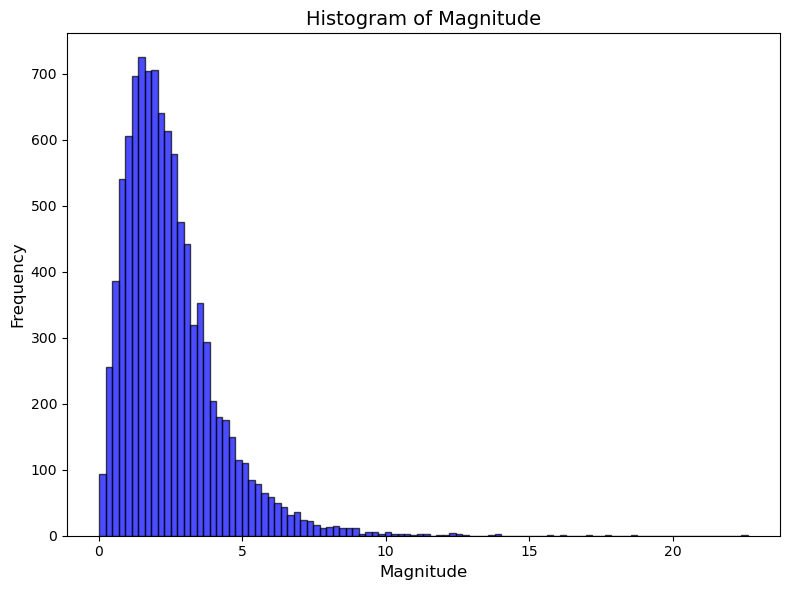

In [27]:
# ヒストグラムの描画

import matplotlib.pyplot as plt
import numpy as np

# Create a figure and axis
fig, ax = plt.subplots(figsize=(8, 6))

# Generate and plot the histogram
data = np.random.choice(magnitude.ravel(), size=10000, replace=False)
ax.hist(data, bins=100, color='blue', edgecolor='black', alpha=0.7)

# Set plot title and labels
ax.set_title('Histogram of Magnitude', fontsize=14)
ax.set_xlabel('Magnitude', fontsize=12)
ax.set_ylabel('Frequency', fontsize=12)

# Improve layout
plt.tight_layout()

# Show the plot
plt.show()

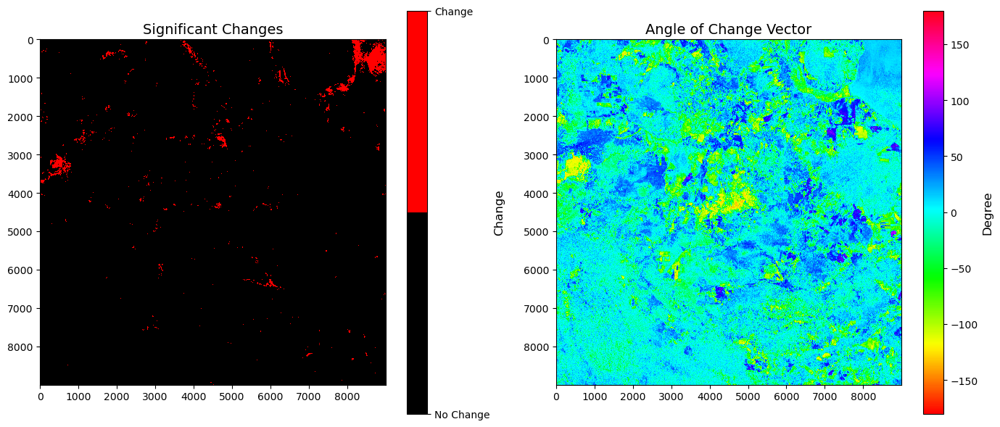

In [29]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

# Calculate the threshold for significant changes
threshold = np.mean(magnitude) + 2 * np.std(magnitude)
significant_change = np.where(magnitude > threshold, 1, 0)

# Define a discrete colormap for significant changes
cmap = ListedColormap(['black', 'red'])

# Create the subplots
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

# Plot significant changes
im1 = axs[0].imshow(significant_change, cmap=cmap, origin='upper')
axs[0].set_title('Significant Changes', fontsize=14)

# Add a colorbar for significant changes
cbar1 = fig.colorbar(im1, ax=axs[0], ticks=[0, 1])
cbar1.ax.set_yticklabels(['No Change', 'Change'])
cbar1.set_label('Change', fontsize=12)

# Plot direction (angle of change)
im2 = axs[1].imshow(angle / 3.14 * 180, cmap='hsv', origin='upper')
axs[1].set_title("Angle of Change Vector", fontsize=14)

# Add a colorbar for direction
cbar2 = fig.colorbar(im2, ax=axs[1])
cbar2.set_label("Degree", fontsize=12)

# Improve layout
plt.tight_layout()

# Show the plot
plt.show()


### 1.2.4. CVA解析結果の分析

理想的にはGIS等で重ね合わせながら分析すべきところですが、本実習では結果画像を見比べて分析します。

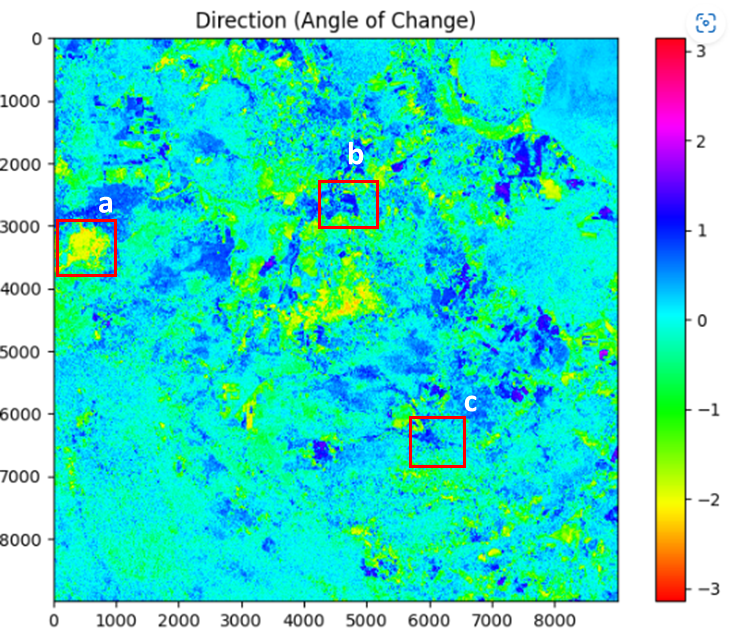
|  位置  |  Google Earth衛星画像 (2007)  | Google Earth衛星画像 (2010)  | 解説 | 
| ---- | ---- |---- | ---- |
| a |  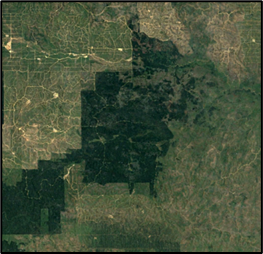 |  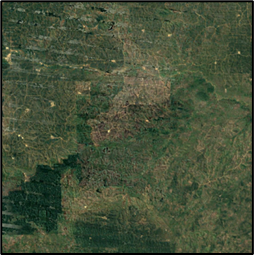 | HH/HVとも散乱が減少したが、HVの減少が顕著であることから、2007～2010にかけて森林を開拓したことが伺える。 |
| b |  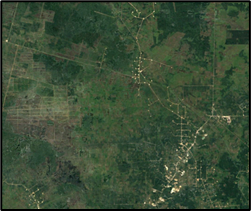  | 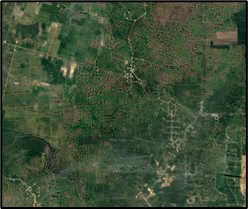  |  HH/HVとも散乱が増加した。森林の減少や建造物の増加が複合的に作用していると考えられる。 |
|c|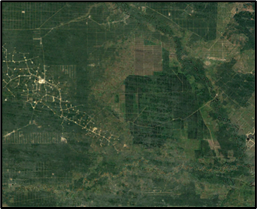|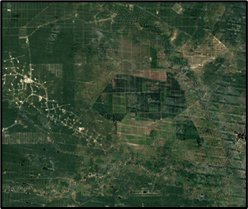|同上|


## 1.3. 本演習手順の利点と利用方法

### Google Earthでわかるのに何故このような込み入った手順を使うのか

- この演習では**運良く**収録されている画像を参照しただけで、それ以外の時期や領域についてはMAXAR社やAirbus社から購入するものです。アーカイブでも 1 km あたり3,000-5,000円するので、オイルパーム農園のように広域にわたる分析に用いるには現実的ではありません。過去の変遷を分析するならば、本演習で使った年次合成データは使い勝手が良いですし無償で使う事ができます（商用利用もOK?）。
- Google Earthに収録されるような高分解能画像を処理するには多くの計算機資源を必要とします。本演習で示した分析手順は**少ない計算量ながらもそこそこ良好な性能**です。

### 上記利点を鑑みた利用方法のアイデア

- 広域の変化検知スクリーニング：本演習のように過去データではなく、最新の観測データを常に処理し続けることで変化検知を自動で通知するシステム
- オイルパーム農園の営農履歴分析：過去データを解析して、農園の発生時期やオイルパームの生長を検知し、多数の農園の経歴をプロファイル化する。
